# Apply AI Superresolution to video - Train New Network from Video Frames

## Use a perception loss
https://github.com/richzhang/PerceptualSimilarity

 

# Get a video dataset to do better training
- higher resolution than used in research

### super 8 look https://www.youtube.com/watch?v=7Q5UZmwxIXo
- low focus (diffusion and blur - bokah)
- low contrast
- camera is more shakey on home movies
- high depth of field everything is sharp
- 4x3
- film grain
- color changes
- mpeg2 compression noise

### VCR look
- jitter on scan lines - see http://www.avisynth.nl/users/vcmohan/DeJitter/DeJitter.htm
- chroma issues https://forum.videohelp.com/threads/397928-Imrpove-old-video-recorded-by-a-bad-camera?s=0a1230911434e7442d05b6b6cee8e6d2

- jpeg compression artifacts

## use images of related material to train superres
- family photos to train for family videos
- need water and outdoors
- use video samples for video
- use film examples for super8

## Data Augmentation
- sample a few frames from a few places - complete
- different blur levels- complete
- different blur levels in the same image - complete
- convolution with disk - complete
- left-right flip - complete
- contrast and brightness - complete
- random crop - use center crop
- crop to the super8 resolution 720x480 or video 320x240 - complete
- GAN statistics
- predict level of blur with same network to encourage differentiation to that
- input of a filter that detects light reflections to help infer blurring
- try mixup
- use a single shot classifier output as an input

- see this library for blending images https://pypi.org/project/blend-modes/


## Optimization
- Use Adam - complete
- Use optimal learning rate
- freeze layers
- dropout
- use fp16 - pytorch1.6 has a new library for this - complete
- train on low res and increase resolution - does not seem to help in convergence

## losses
- try l1 loss - does not converge
- try perceptive loss vgg18 - complete
- perceptive loss uses 256x256 images - too low res, so use overlapping subsets of image to calc loss
- combine perceptive and mse loss
- calculate mse loss on a smoothed version of output compared to input (which is smoothed) - ensure reversal matches


## do comparisons for standard test sets
- not super useful since they use gaussian blurring, bicubic interpolation
- get very focused images and use as a validation and test set - prefer one thats published


## Results & Analysis
- Fixes - jpeg artifacts were fixed at one level 30 and slope at 0.01 in:
Superresolution train vdsr with multifuz
Superresolution train vdsr with perception loss multifuz

- mse only goes so far.  too strict
- Perceptual loss helps improve it, but input is 256x256 resolution so limited sharpness.
- Perceptual loss tiled (hires) causes too much causes artifacts
- multifuz improves results especially with perceptual loss, handles different fuzziness better

Next experiment
- training may not need to go as long - complete
- set kernel range from 1 to 20 - vs 4-20 need lower range too - complete
- combination of hi res perceptual and mse on smoothed versions of input.- complete
- give more emphasis to mse

Other ideas
- train on cleaner images div8K
- cascade 2 models.  Train first as usual.  Use it to preprocess input to train second model
- apply mix-up
- better model and apply to all 3 colors - tried, but no improvement.
- try vgg perception metric
- focus prediction


RCAN Results
- Uses lots of resources as scale of image increases
- Does not handle different scales well
- not meant for restoration - 
To try
- Apply pretrained model on a patch thats 48x48 then can judge if its worth making an approach to apply repeatedly to larger images.
- train vdsr with a convolutional upscaling up front, attention, residuals.

UNET results
- Some sharpening but not drastic.  Not better than VDSR
- Used 2x GPU mem than VDSR

New Network results
- Performs as well as VDSR qualitatively, need to check.
- using Div2K gives better results (needs low learning rate)
- try with L1 norm (less noise sensitive)
- add upscale in the middle to allow more flexibility - nn.ConvTranspose2d(in_channels=C, out_channels=M, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False)
- add  with torch.no_grad():  to validation and prediction with the model to speed up computations.


To Try
- UNET or VDSR with MAXout nonlinear function.  Try different activation functions (mish,etc).
- consistency error measure like fastai superres
- provide input,target  pairs with no fuzziness in the training set.
- Train exclusively on very sharp  images (DIV2K)
- Predict focus as a segmentation in addition to enhancing
- have 3 channel inputs (RGB or ??) and then have 1 channel output
- provide frame-1,frame,frame+1 to predict frame
- opposite of bottleneck - input resolution -> high res -> input res blocks.
- combo of UNET and VDSR
- attention?
- combo of perception and mse measure
- add validation set
- sort dataset into hard cases and easy cases, making cases harder with time.  (train on easy cases first, then fine tune with harder cases)
- make the camera model version of the data loader
- use mse but give more error to perception
- try reflection padding







## Share results
- put out an example on youtube to allow comparison


# Project Documentation

In [1]:

from pathlib import Path
import os


project_base = "/media/SSD/superres/"
results_folder = "Results"
data_folder = "video_data"
model_folder = "checkpoint"

model_name_base = "NEWCNN5"


## Experiment documentation

In [2]:
%%javascript
var nb = IPython.notebook;
var kernel = IPython.notebook.kernel;
var command = "NOTEBOOK_FULL_PATH = '" + nb.base_url + nb.notebook_path + "'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [3]:
print("NOTEBOOK_FULL_PATH:\n", NOTEBOOK_FULL_PATH)

NOTEBOOK_FULL_PATH:
 /SSD_link/superres/Superresolution train New Network with kernel predictor input v1.ipynb


In [4]:
nb_path = Path(NOTEBOOK_FULL_PATH)
print(nb_path)

# Make result folder if it does not exist
result_path = Path(project_base, results_folder , nb_path.stem )
print(result_path)
os.makedirs(result_path, exist_ok=True)

/SSD_link/superres/Superresolution train New Network with kernel predictor input v1.ipynb
/media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1


In [5]:
model_out_path=Path(project_base)/model_folder
print(model_out_path)
os.makedirs(model_out_path, exist_ok=True)

/media/SSD/superres/checkpoint


In [6]:
# Tie a result to a set of params.  Tie a set of params to a model.  Tie a model to a notebook.
# register the experiment to get a unique run id
# save all the results in a repository
# use github to do it?

In [7]:

#%reload_ext autoreload
#%autoreload 2
#%matplotlib inline


import cv2 
import numpy as np
import subprocess as sp
import time
from tqdm import tqdm, trange
import torch
from torch.autograd import Variable
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

from torchvision.transforms import RandomHorizontalFlip,ColorJitter
from torchvision.transforms import Compose, CenterCrop, ToTensor, Resize, Grayscale,ToPILImage,Normalize

import random

import lpips #https://github.com/richzhang/PerceptualSimilarity

In [8]:
import torch.utils.data as data

from os import listdir
from os.path import join
from PIL import Image, ImageFilter
import numpy as np
import torchvision as vision

import numbers

torch.cuda.manual_seed(42)

Create a data loader
- see https://github.com/2KangHo/vdsr_pytorch/blob/master/data.py
- see https://github.com/2KangHo/vdsr_pytorch/blob/master/data_utils.py

In [9]:
import fnmatch

In [10]:
from superres_utils import make_framelist, load_frame, RescaleCrop, Multifuz, DatasetFromVideoFolder
from superres_utils import show_batch
from superres_utils import pil_disk_blur, display_PSNR, test_results, superres_mp4

In [ ]:
# get a list of all the data
instances = make_framelist("/home/filip/SSD_link/superres/DIV2K/DIV2K_train_HR",1)

In [ ]:
#test the Multifuz transform
im=load_frame(instances[10])
#im = Grayscale(num_output_channels=1)(im)
im = RescaleCrop(crop_size=(480,720),kernel_width=10)(im)
im_res = Multifuz(crop_size = (480,720),
                  center=(360,240),
                  kernel_a=2, 
                  kernel_b=10,
                  quality=np.int16(22), 
                  slope=.1,
                 radius=50,
                 scale=1)(im)
print(im.size,im_res.size)
type(im_res)
im_res

In [11]:
def input_transform():        
    return Compose([        
        #Grayscale(num_output_channels=1),
        ToTensor(),
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])



def target_transform(crop_size):
    return Compose([
        #Grayscale(num_output_channels=1),
        CenterCrop(crop_size),
        ToTensor(),
    ])


In [12]:
train_dir = "/home/filip/SSD_link/superres/DIV2K/DIV2K_train_HR"
#train_dir = "/home/filip/SSD_link/superres/video_data/train_data"
frame_sample_size =10
batch_size = 4 # Make 4 For FP16, 480x720 size images
crop_size = (480,720)
#crop_size = (256,256)
kernel_range=(1,16)
quality_range=(30,90) 
slope_range=(0.001, 0.1)
radius_range=(0,0)  # make all one fuzziness
scale_range=(1/2,2)
Flip_hor=True
Rand_bright_contrast=True

In [13]:
train_set = DatasetFromVideoFolder(train_dir,crop_size,frame_sample_size,
                                   input_transform=input_transform(),
                                   target_transform=target_transform(crop_size),
                                   Flip_hor=Flip_hor,
                                   Rand_bright_contrast=Rand_bright_contrast,
                                   kernel_range=kernel_range,
                                   quality_range=quality_range,
                                   slope_range=slope_range,
                                   radius_range=radius_range,
                                   scale_range=scale_range,
                                   max_kernel=10
                            )
training_data_loader = DataLoader(dataset=train_set, num_workers=0, batch_size=batch_size, shuffle=True)

In [14]:
valid_dir = "/home/filip/SSD_link/superres/DIV2K/DIV2K_valid_HR"
#frame_sample_size =10
#batch_size = 4 # Make 4 For FP16, 480x720 size images
#crop_size = (480,720)

kernel_range=(1,16)
quality_range=(30,99) 
slope_range=(0.001, 0.1)
radius_range=(0,0)  # make all one fuzziness
scale_range=(1/2,2)
Flip_hor=False
Rand_bright_contrast=False
match_exp = "*.*"

In [15]:
valid_set = DatasetFromVideoFolder(valid_dir,crop_size,frame_sample_size,
                                   input_transform=input_transform(),
                                   target_transform=target_transform(crop_size),
                                   Flip_hor=Flip_hor,
                                   Rand_bright_contrast=Rand_bright_contrast,
                                   kernel_range=kernel_range,
                                   quality_range=quality_range,
                                   slope_range=slope_range,
                                   radius_range=radius_range,
                                   scale_range=scale_range,
                                   max_kernel=10,
                                   match_exp=match_exp,
                            )
valid_data_loader = DataLoader(dataset=valid_set, num_workers=0, batch_size=batch_size, shuffle=False)

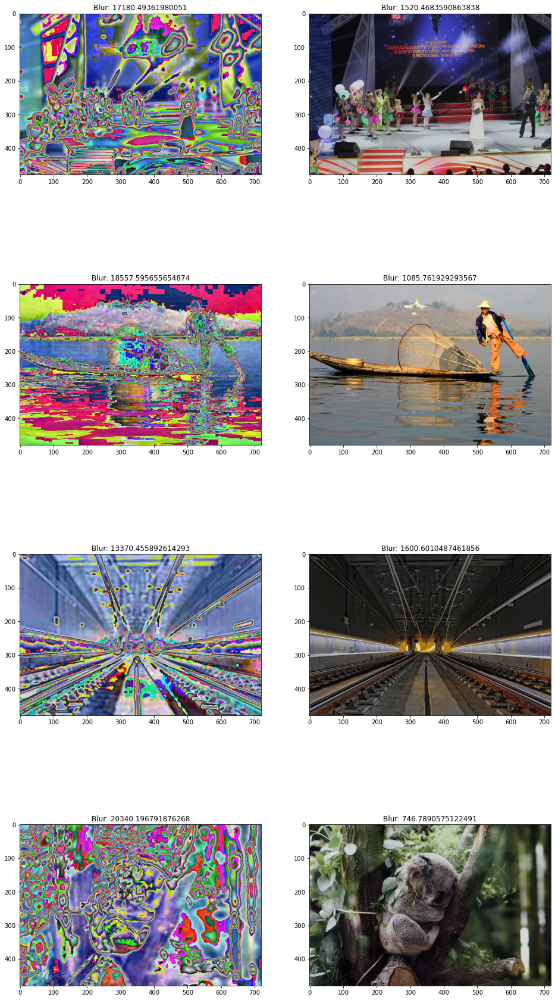

In [16]:
show_batch(training_data_loader,size =8)

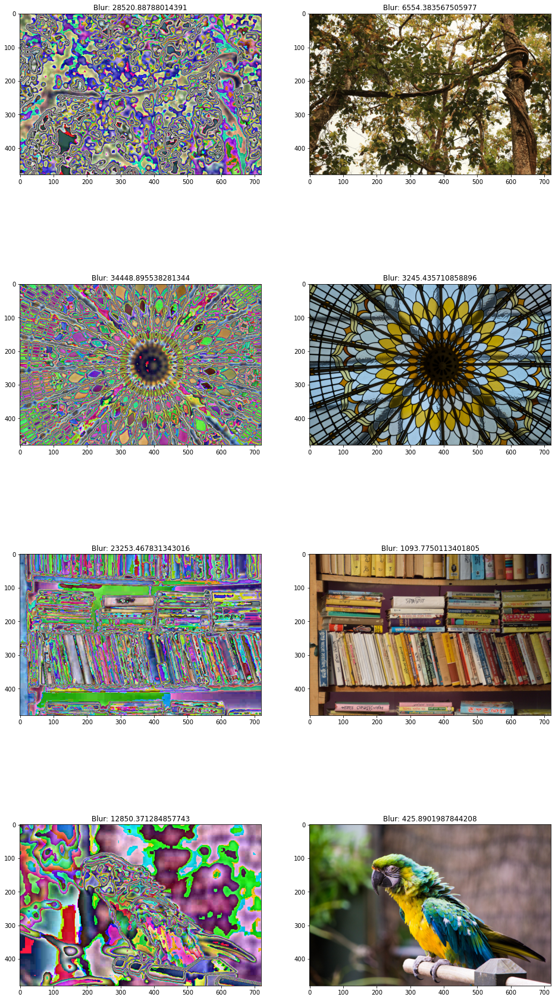

In [17]:
show_batch(valid_data_loader,size =8)

# NEW CNN

In [18]:
import torch.nn as nn

class NEWNet5(nn.Module):
    def __init__(self, c1, c2, c3):
        super(NEWNet5, self).__init__()   
        
        self.p1 = nn.Sequential(
            nn.Conv2d(in_channels=4, out_channels=c1, kernel_size=3, stride=1, padding=1, bias=False),
            nn.PReLU(),
            nn.Conv2d(in_channels=c1, out_channels=c1, kernel_size=3, stride=1, padding=1, bias=True),
            nn.PReLU(),
            nn.Conv2d(in_channels=c1, out_channels=c1, kernel_size=3, stride=1, padding=1, bias=True),
            nn.PReLU()
        )
        
        self.p2 = nn.Sequential(
            nn.Conv2d(in_channels=c1, out_channels=c2, kernel_size=1, stride=1, padding=0, bias=True),
            nn.PReLU(),
            nn.Conv2d(in_channels=c2, out_channels=c2, kernel_size=3, stride=1, padding=1, bias=True),
            nn.PReLU(),
            nn.Conv2d(in_channels=c2, out_channels=c1, kernel_size=1, stride=1, padding=0, bias=True)
        )
        
        

        
        self.prelu = nn.PReLU()
        self.convf = nn.Conv2d(in_channels=c1, out_channels=3, kernel_size=3, stride=1, padding=1, bias=True)
        
                    
        
        
    def forward(self, x, k):    
        
        residual = x
        # add insert k as the 4th channel into x, which has three channels
        one_channel = x[:,0,:,:].unsqueeze(1)  #use one channel as a template
        t1 = torch.ones_like(one_channel.permute(3,2,1,0))  #make a ones tensor like the channel
        res = k[:,0]*t1  # multiply by k, so that the batch spreads to the size of an image
        res = res.permute(3,2,1,0) # put back in proper order
        xk = torch.cat((x,res), dim=1) #append the 4th channel
        
        
        
        
        xk = self.p1(xk)
        skip1 = xk
                        
        xk = self.p2(xk)
        xk = xk.add_(skip1)
        xk = self.prelu(xk)
        xk = self.convf(xk)
        out = torch.add(xk,residual)
        return out

# build the model

In [19]:
#model = NEWNet2(c1=64,c2=128)
model = NEWNet5(c1=64,c2=128, c3=1024)
model.cuda()

NEWNet5(
  (p1): Sequential(
    (0): Conv2d(4, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): PReLU(num_parameters=1)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): PReLU(num_parameters=1)
    (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): PReLU(num_parameters=1)
  )
  (p2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=1)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): PReLU(num_parameters=1)
    (4): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1))
  )
  (prelu): PReLU(num_parameters=1)
  (convf): Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [ ]:
num_pixels = crop_size[0] * crop_size[1]

In [ ]:
def loss_scaler(im):
    # scale to -1,1 and convert to 3 channel (greyscale to RBG)
    return (im * 2 - 1).expand(-1, 3, -1, -1)

In [ ]:
class Pixel_Loss(torch.nn.Module):
    
    def __init__(self,num_pixels):
        super(Pixel_Loss,self).__init__()
        self.lossfn = nn.MSELoss(reduction = 'mean')
        
        self.percep_loss_fn = lpips.LPIPS(net='alex').cuda()


        self.num_pixels = num_pixels
    #def forward(self,x,y):
        
     #   return self.num_pixels*(self.lossfn.forward(x,y))
    
    
    def forward(self,x,y):
        
        totloss = torch.mean(self.percep_loss_fn.forward(loss_scaler(x),loss_scaler(y)))
        #print("perceptual:",totloss)
        
        totloss.add_(50 * self.lossfn.forward(x,y))
        #print("total:",totloss)
        
        return totloss


In [20]:
#criterion = Pixel_Loss(num_pixels)
criterion = nn.L1Loss(reduction = 'mean')
criterionk = nn.MSELoss(reduction = 'mean')


In [21]:
init_lr = .001
lr_step = 6
gradient_clip = 0.4
epochs = 54

loops = 8

In [22]:

#optimizer = optim.Adam(model.parameters(), lr=init_lr, weight_decay=1e-4)
optimizer = optim.Adam(model.parameters(), lr=init_lr, weight_decay=0)



In [23]:
scheduler = optim.lr_scheduler.OneCycleLR(optimizer, 
                                          max_lr=0.01,
                                          steps_per_epoch=len(training_data_loader),
                                          epochs=epochs)

In [24]:
def adjust_learning_rate(optimizer, epoch):
    """Sets the learning rate to the initial LR decayed by 10**0.5 every 3 epochs"""
    lr = init_lr * (0.1 ** (.5*(epoch // lr_step)))
    return lr

In [25]:
def save_checkpoint(experiment, model, epoch, valid_error):

    model_out_str = str(model_out_path/(model_name_base+"_epoch_{}.pth")).format(epoch)
    
    state = {"experiment": experiment, "epoch": epoch ,"model": model, "valid_error": valid_error}

    torch.save(state, model_out_str)

    print("Checkpoint saved to {}".format(model_out_str))

In [26]:
kmodel = torch.load("/media/SSD/superres/checkpoint/BLUR_SHUFFLE1_epoch_18.pth")["model"]

In [27]:
kmodel.cuda()
kmodel.eval()

ShuffleNetV2(
  (conv1): Sequential(
    (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (stage2): Sequential(
    (0): InvertedResidual(
      (branch1): Sequential(
        (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (3): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (4): ReLU(inplace=True)
      )
      (branch2): Sequential(
        (0): Conv2d(24, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_

In [ ]:
inputs, outputs, camera_specs = next(iter(training_data_loader))

In [ ]:
inputs.shape

In [ ]:
inputs = inputs.cuda()

            
with torch.no_grad():
    with autocast():
        k = kmodel(inputs)

In [ ]:
inputs = torch.ones(4,3,5,10).cuda()
inputs.shape

In [ ]:
one_channel = inputs[:,0,:,:].unsqueeze(1)
one_channel.shape

In [ ]:
t1 = torch.ones_like(one_channel.permute(3,2,1,0))
t1.shape

In [ ]:
k

In [ ]:
k[:,0]

In [ ]:
res = k[:,0]*t1
res.shape

In [ ]:
res = res.permute(3,2,1,0)

In [ ]:
res.shape

In [ ]:
xk = torch.cat((inputs,res), dim=1)

In [ ]:
xk.shape

In [ ]:
xk[3,3]

In [28]:
import datetime
from torch.cuda.amp import autocast
from torch.cuda.amp import GradScaler
#import kornia


In [29]:
from torch.optim.swa_utils import AveragedModel
swa_model = torch.optim.swa_utils.AveragedModel(model)

In [30]:
def trainfp16(training_data_loader, optimizer, scheduler, model,  kmodel, epoch,scaler, loops):
    dt = str(datetime.datetime.now())
    print("Start Time:", dt)
    
    lr = adjust_learning_rate(optimizer, epoch-1)

    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

    print("Epoch = {}, lr = {}".format(epoch, optimizer.param_groups[0]["lr"]))

    model.train()
    
    cum_loss = 0
    ct=0  ##need to use a different variable.
    ct2=0

    pbar = tqdm(total=loops*len(training_data_loader))
    for loop_count in range(loops):  
        for iteration, batch in enumerate(training_data_loader, 1):
            inpt, target, camera_specs = batch[0], batch[1], batch[2]


            inpt = inpt.cuda()

            target = target.cuda()
            
            with torch.no_grad():
                with autocast():
                    k_pred = kmodel(inpt)
            
            
            #k_target = (camera_specs["kernel_a"].float()).cuda()

            optimizer.zero_grad()

            # Runs the forward pass with autocasting.
            with autocast():
                output = model(inpt,k_pred)
                loss = criterion(output, target)


            
            scaler.scale(loss).backward()
            #loss.backward() 

            # Unscales the gradients of optimizer's assigned params in-place
            #scaler.unscale_(optimizer)

            #nn.utils.clip_grad_norm_(model.parameters(),gradient_clip) 

            #optimizer.step()
            scaler.step(optimizer)

            if epoch>1:
                swa_model.update_parameters(model)

            # Updates the scale for next iteration.
            scaler.update()

            #scheduler.step()

            cum_loss = cum_loss + loss.data


            ct = ct +1 



            pbar.update(1)
    pbar.close()    
   
    print("Epoch Loss:", cum_loss/ct)        

In [31]:
def validatefp16(valid_data_loader, model, kmodel,  loop=10):

    model.eval()
    cum_loss2=0
    cum_loss1 = 0
    ct=0 
    
    with torch.no_grad():
        for r in trange(loop):
            for iteration, batch in enumerate(valid_data_loader, 1):
                inpt, target, camera_specs = batch[0], batch[1], batch[2]


                inpt = inpt.cuda()

                target = target.cuda()
                
                
                with autocast():
                    k_pred = kmodel(inpt)
                
                k_target = (camera_specs["kernel_a"].float()).cuda()
                
                # Runs the forward pass with autocasting.
                with autocast():
                    output = model(inpt,k_pred)
                    loss1 = criterion(output, target)
                    loss2 = criterionk(k_pred[:,0],k_target)

                #print(k_pred[:,0].shape, k_target.shape)
               
                cum_loss1 = cum_loss1 + loss1.data
                cum_loss2 = cum_loss2 + loss2.data

                ct = ct + 1 ## Used to be batch_size





        print("===> Epoch Validation Loss: {:.10f} , kernel pred RMSE {:.10f}".format(cum_loss1/ct,(cum_loss2/ct)**(.5)) )
    
    return (cum_loss1/ct).item()

In [ ]:
#model = torch.load("/media/SSD/superres/checkpoint/NEWCNN3_epoch_54.pth")["model"]

In [ ]:
#validatefp16(valid_data_loader, model, criterion, loop=1)

f1 = "/media/SSD/superres/checkpoint/NEWCNN_epoch_"
f3 = ".pth"
lst =[]
for i in range(1,13):
    model = torch.load(f1+str(i)+f3)["model"]
    lst.append(validatefp16(valid_data_loader, model, criterion, loop=10))
    print(lst)
    
    

In [32]:
# Creates a GradScaler once at the beginning of training for mixed precision
scaler = GradScaler()


for epoch in range(1, epochs+1):
        trainfp16(training_data_loader, optimizer, scheduler, model, kmodel, epoch,scaler,loops)
        valid_error = validatefp16(valid_data_loader, model,kmodel,loop=10)
        save_checkpoint(NOTEBOOK_FULL_PATH, model, epoch, valid_error)

  0%|          | 0/1600 [00:00<?, ?it/s]

Start Time: 2020-10-29 17:13:31.598242
Epoch = 1, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.1161, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0764529780 , kernel pred RMSE 0.7373644114
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_1.pth
Start Time: 2020-10-29 17:35:58.604071
Epoch = 2, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0845, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0691344291 , kernel pred RMSE 0.7113651037
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_2.pth
Start Time: 2020-10-29 17:57:06.735273
Epoch = 3, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0816, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0718875825 , kernel pred RMSE 0.7096009851
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_3.pth
Start Time: 2020-10-29 18:17:57.191921
Epoch = 4, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0758, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0627008006 , kernel pred RMSE 0.7393065095
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_4.pth
Start Time: 2020-10-29 18:38:43.297219
Epoch = 5, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0744, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0654296577 , kernel pred RMSE 0.7346892357
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_5.pth
Start Time: 2020-10-29 18:59:28.415856
Epoch = 6, lr = 0.001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0727, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0613051355 , kernel pred RMSE 0.7418251634
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_6.pth
Start Time: 2020-10-29 19:20:14.114541
Epoch = 7, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0630, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0596791469 , kernel pred RMSE 0.7385932803
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_7.pth
Start Time: 2020-10-29 19:40:59.435914
Epoch = 8, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0624, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0602425486 , kernel pred RMSE 0.7356131077
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_8.pth
Start Time: 2020-10-29 20:01:47.677009
Epoch = 9, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0613, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0567244515 , kernel pred RMSE 0.7349365950
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_9.pth
Start Time: 2020-10-29 20:22:30.141158
Epoch = 10, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0615, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0567985289 , kernel pred RMSE 0.7426020503
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_10.pth
Start Time: 2020-10-29 20:43:12.467690
Epoch = 11, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0612, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0663265586 , kernel pred RMSE 0.7273774743
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_11.pth
Start Time: 2020-10-29 21:03:54.937747
Epoch = 12, lr = 0.00031622776601683794


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0611, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0553365275 , kernel pred RMSE 0.7293098569
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_12.pth
Start Time: 2020-10-29 21:24:37.620503
Epoch = 13, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0578, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0525799505 , kernel pred RMSE 0.7579149604
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_13.pth
Start Time: 2020-10-29 21:45:19.994426
Epoch = 14, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0578, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0582005307 , kernel pred RMSE 0.7580258250
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_14.pth
Start Time: 2020-10-29 22:06:03.150008
Epoch = 15, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0578, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0516729206 , kernel pred RMSE 0.7433419228
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_15.pth
Start Time: 2020-10-29 22:26:46.150823
Epoch = 16, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0577, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0478291661 , kernel pred RMSE 0.7525320053
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_16.pth
Start Time: 2020-10-29 22:47:28.733033
Epoch = 17, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0578, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0559875853 , kernel pred RMSE 0.7571406364
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_17.pth
Start Time: 2020-10-29 23:08:11.681503
Epoch = 18, lr = 0.0001


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0577, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0523895323 , kernel pred RMSE 0.7546383739
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_18.pth
Start Time: 2020-10-29 23:28:54.026731
Epoch = 19, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0564, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0539334714 , kernel pred RMSE 0.7519769669
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_19.pth
Start Time: 2020-10-29 23:49:36.978749
Epoch = 20, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0563, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0490992181 , kernel pred RMSE 0.7512961030
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_20.pth
Start Time: 2020-10-30 00:10:20.100570
Epoch = 21, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0564, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0564548969 , kernel pred RMSE 0.7473986149
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_21.pth
Start Time: 2020-10-30 00:31:02.729935
Epoch = 22, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0562, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0504647158 , kernel pred RMSE 0.7479016781
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_22.pth
Start Time: 2020-10-30 00:51:45.066245
Epoch = 23, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0557, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0499510020 , kernel pred RMSE 0.7297573090
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_23.pth
Start Time: 2020-10-30 01:12:27.033607
Epoch = 24, lr = 3.16227766016838e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0565, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0489923880 , kernel pred RMSE 0.7478436828
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_24.pth
Start Time: 2020-10-30 01:33:09.689729
Epoch = 25, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0561, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0513041317 , kernel pred RMSE 0.7441636324
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_25.pth
Start Time: 2020-10-30 01:53:52.469466
Epoch = 26, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0553, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0498242974 , kernel pred RMSE 0.7446778417
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_26.pth
Start Time: 2020-10-30 02:14:35.384152
Epoch = 27, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0554, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0499973744 , kernel pred RMSE 0.7268396020
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_27.pth
Start Time: 2020-10-30 02:35:17.274369
Epoch = 28, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0555, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0495526306 , kernel pred RMSE 0.7424337864
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_28.pth
Start Time: 2020-10-30 02:55:59.666926
Epoch = 29, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0555, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0498205796 , kernel pred RMSE 0.7557470798
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_29.pth
Start Time: 2020-10-30 03:16:42.383464
Epoch = 30, lr = 1.0000000000000003e-05


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0556, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0490977615 , kernel pred RMSE 0.7200930715
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_30.pth
Start Time: 2020-10-30 03:37:24.596237
Epoch = 31, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0554, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0494912528 , kernel pred RMSE 0.7378233671
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_31.pth
Start Time: 2020-10-30 03:58:06.686110
Epoch = 32, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0556, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0492608026 , kernel pred RMSE 0.7423704863
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_32.pth
Start Time: 2020-10-30 04:18:50.067010
Epoch = 33, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0558, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0499555580 , kernel pred RMSE 0.7864369154
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_33.pth
Start Time: 2020-10-30 04:39:32.512399
Epoch = 34, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0560, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0502658300 , kernel pred RMSE 0.7397109866
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_34.pth
Start Time: 2020-10-30 05:00:15.700500
Epoch = 35, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0559, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0496304035 , kernel pred RMSE 0.7165977955
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_35.pth
Start Time: 2020-10-30 05:20:58.299712
Epoch = 36, lr = 3.16227766016838e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0556, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0500570647 , kernel pred RMSE 0.7507870197
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_36.pth
Start Time: 2020-10-30 05:41:40.958777
Epoch = 37, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0555, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0494178198 , kernel pred RMSE 0.7302347422
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_37.pth
Start Time: 2020-10-30 06:02:22.911148
Epoch = 38, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0557, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0483944975 , kernel pred RMSE 0.7431365848
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_38.pth
Start Time: 2020-10-30 06:23:05.823805
Epoch = 39, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0555, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0493322089 , kernel pred RMSE 0.7594378591
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_39.pth
Start Time: 2020-10-30 06:43:48.651781
Epoch = 40, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0555, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0492125042 , kernel pred RMSE 0.7114871740
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_40.pth
Start Time: 2020-10-30 07:04:31.801734
Epoch = 41, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0553, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0497911051 , kernel pred RMSE 0.7488621473
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_41.pth
Start Time: 2020-10-30 07:25:14.107349
Epoch = 42, lr = 1.0000000000000002e-06


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0555, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0495007709 , kernel pred RMSE 0.7783775926
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_42.pth
Start Time: 2020-10-30 07:45:55.966185
Epoch = 43, lr = 3.16227766016838e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0555, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0500358976 , kernel pred RMSE 0.7365026474
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_43.pth
Start Time: 2020-10-30 08:06:38.374660
Epoch = 44, lr = 3.16227766016838e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0555, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0495558940 , kernel pred RMSE 0.7666982412
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_44.pth
Start Time: 2020-10-30 08:27:20.940535
Epoch = 45, lr = 3.16227766016838e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0557, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0497237220 , kernel pred RMSE 0.7605174184
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_45.pth
Start Time: 2020-10-30 08:48:05.825222
Epoch = 46, lr = 3.16227766016838e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0556, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0501930565 , kernel pred RMSE 0.7386038899
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_46.pth
Start Time: 2020-10-30 09:08:53.770399
Epoch = 47, lr = 3.16227766016838e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0556, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0492350832 , kernel pred RMSE 0.7830501795
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_47.pth
Start Time: 2020-10-30 09:29:39.779006
Epoch = 48, lr = 3.16227766016838e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0557, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0499460623 , kernel pred RMSE 0.7649117708
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_48.pth
Start Time: 2020-10-30 09:50:25.707626
Epoch = 49, lr = 1.0000000000000002e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0550, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0492189974 , kernel pred RMSE 0.7285075784
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_49.pth
Start Time: 2020-10-30 10:11:12.218344
Epoch = 50, lr = 1.0000000000000002e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0557, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0497980267 , kernel pred RMSE 0.7203606367
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_50.pth
Start Time: 2020-10-30 10:31:57.881889
Epoch = 51, lr = 1.0000000000000002e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0556, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0490673259 , kernel pred RMSE 0.7265951633
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_51.pth
Start Time: 2020-10-30 10:52:43.278338
Epoch = 52, lr = 1.0000000000000002e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0557, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0493408777 , kernel pred RMSE 0.7530767322
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_52.pth
Start Time: 2020-10-30 11:13:28.858728
Epoch = 53, lr = 1.0000000000000002e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0554, device='cuda:0')


  0%|          | 0/1600 [00:00<?, ?it/s]

===> Epoch Validation Loss: 0.0492221639 , kernel pred RMSE 0.7241990566
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_53.pth
Start Time: 2020-10-30 11:34:14.443967
Epoch = 54, lr = 1.0000000000000002e-07


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch Loss: tensor(0.0558, device='cuda:0')


100%|██████████| 10/10 [01:55<00:00, 11.58s/it]

===> Epoch Validation Loss: 0.0489495955 , kernel pred RMSE 0.7452305555
Checkpoint saved to /media/SSD/superres/checkpoint/NEWCNN5_epoch_54.pth


Function that takes in a .mp4 video file and applies intrinsic matrix and distortion coefficients to undistort a video.  It also preserves the sound. it uses ffmpeg for some processing as well as opencv cv2 library.

In [ ]:
#model = torch.load("/media/SSD/superres/checkpoint/NEWCNN4_epoch_54.pth")["model"]

In [91]:
def sb(batin,batout, size=8):

    
    outputs = batout.numpy().transpose((0, 2, 3, 1))
    inputs = batin.numpy().transpose((0, 2, 3, 1))
    
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inputs = inputs*std + mean
    
    outputs = (outputs*255.0).clip(0,255)
    inputs = (inputs*255.0).clip(0,255)
    
    fig=plt.figure(figsize=(2*size, 4*size))
    rows = outputs.shape[0]
    columns = 2
    ax=[]
    for i in range(0, rows):
        ax.append(fig.add_subplot(rows, columns, 2*i+1))
        plt.imshow((inputs[i]).astype(np.uint8),cmap='gray')
        ax.append(fig.add_subplot(rows, columns, 2*i+2))
        plt.imshow((outputs[i]).astype(np.uint8),cmap='gray')
    plt.show()
    
   
    
   

In [130]:
class Combine_Nets(nn.Module):
    def __init__(self, model, kmodel):
        super(Combine_Nets, self).__init__()   
        
        
        self.model = model
        self.kmodel = kmodel
        
        

    def forward(self, x):    
        
       
        k = self.kmodel(x)
        x = self.model(x,k)
        
        return x,k

In [169]:
mcombine = Combine_Nets(model,kmodel)

In [170]:
inputs, outputs, camera_specs = next(iter(training_data_loader))

In [171]:
inputs = inputs.cuda()

            
with torch.no_grad():
    with autocast():
        out = mcombine(inputs)

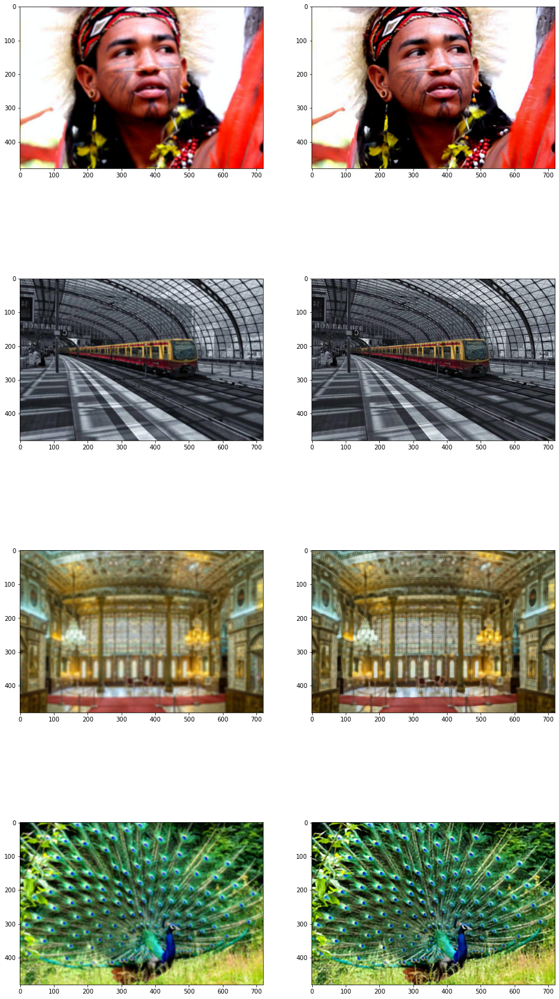

In [172]:
sb(inputs.cpu(),out[0].cpu())

In [173]:
out[1]

tensor([[6.5820],
        [3.1016],
        [9.7734],
        [6.6445]], device='cuda:0', dtype=torch.float16)

In [415]:
def cv2_to_batch_tensor(img_bgr):
    mn=np.array([0.485, 0.456, 0.406])
    std=np.array([0.229, 0.224, 0.225])
    im_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    im_rgb = im_rgb/255.0
    im_rgb = (im_rgb-mn)/std
    tform = im_rgb.transpose(( 2,0, 1))
    tform = torch.from_numpy(tform).float()
    tform = tform.unsqueeze(0)
    return tform

In [416]:
def batch_tensor_to_cv2(bt_3ch):
    bt_3ch = (bt_3ch*255.0).clamp(0,255)
    t_3ch = bt_3ch.squeeze(0)
    #t_3ch = t_3ch.cpu()
    im_rbg = t_3ch.permute(1,2,0).numpy().astype(np.uint8)
    im_bgr = cv2.cvtColor(im_rbg, cv2.COLOR_RGB2BGR)
    
    return im_bgr

In [417]:
# test
img_cv = cv2.imread("/home/filip/Pictures/Screenshot from super8_best_from_mp2.mp4.png")

t = cv2_to_batch_tensor(img_bgr=img_cv)
print(t.shape)
img_cv2 = batch_tensor_to_cv2(bt_3ch=t)



torch.Size([1, 3, 480, 720])


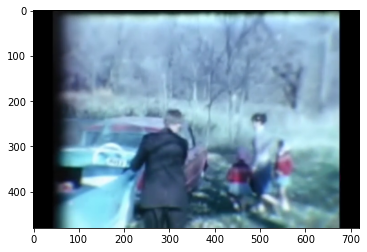

In [418]:
plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))

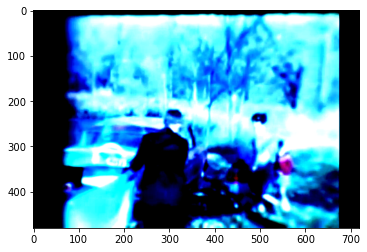

In [419]:
plt.imshow(cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB))

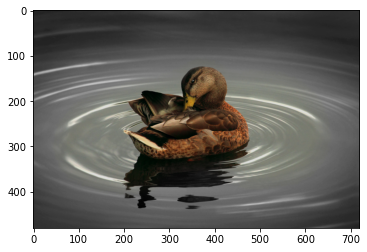

In [420]:
#test2
#t = torch.rand(1,3,1,1)
inputs, outputs, camera_specs = next(iter(training_data_loader))

t=outputs[0].unsqueeze(0)
img_cv = batch_tensor_to_cv2(bt_3ch=t)
t2 = cv2_to_batch_tensor(img_bgr=img_cv)
plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))

In [174]:
img = Image.open("/home/filip/Pictures/Screenshot from super8_best_from_mp2.mp4.png").convert("RGB")

In [194]:
img = cv2.imread("/home/filip/Pictures/Screenshot from super8_best_from_mp2.mp4.png")
    # convert to PIL RGB
im_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Image.fromarray(im_rgb)
im_input = im_rgb/255.0

In [195]:
#im_input = np.array(img)/255.0
im_input.shape

(480, 720, 3)

In [196]:
mn=np.array([0.485, 0.456, 0.406])
std=np.array([0.229, 0.224, 0.225])
im_input = (im_input-mn)/std

In [197]:
tform = im_input.transpose(( 2,0, 1))
tform.shape

(3, 480, 720)

In [198]:
tform = torch.from_numpy(tform).float()
tform.shape

torch.Size([3, 480, 720])

In [199]:
inputs = tform.unsqueeze(0)
inputs.shape

torch.Size([1, 3, 480, 720])

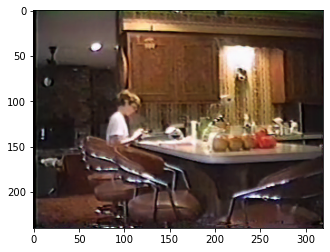

In [429]:
#test
img_cv = cv2.imread("/media/SSD/superres/Screenshot from snip.mp4.png")
inputs = cv2_to_batch_tensor(img_bgr=img_cv)
inputs = inputs.cuda()

            
with torch.no_grad():
    with autocast():
        out = mcombine(inputs)
im_out = batch_tensor_to_cv2(out[0].cpu())
plt.imshow(cv2.cvtColor(im_out, cv2.COLOR_BGR2RGB))

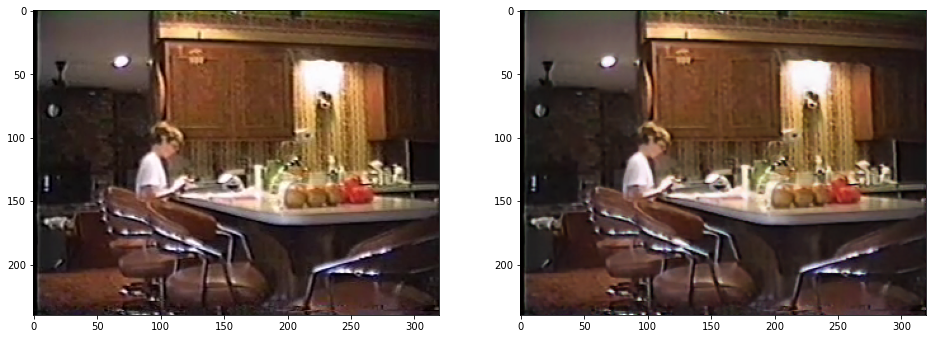

In [430]:
sb(inputs.cpu(),out[0].cpu())

In [149]:
import math
# Here is the function for PSNR calculation
def PSNR(pred, gt, shave_border=0):
    height, width = pred.shape[:2]
    pred = pred[shave_border:height - shave_border, shave_border:width - shave_border]
    gt = gt[shave_border:height - shave_border, shave_border:width - shave_border]
    imdff = pred - gt
    rmse = math.sqrt(np.mean(imdff ** 2))
    if rmse == 0:
        return 100
    return 20 * math.log10(255.0 / rmse)

In [471]:
from superres_utils import PSNR, decolorize, variance_of_laplacian, is_image_file

def display_PSNR(im_gt, im_b, im_in, model, channels=1, display=True, k_scale = 1.0):
    
    model.eval()
    
    #mn=np.array([0.485, 0.456, 0.406])
    #std=np.array([0.229, 0.224, 0.225])
    

    # Convert the images into YCbCr mode and extraction the Y channel (for PSNR calculation)
    im_gt_ycbcr = np.array(im_gt.convert("YCbCr"))
    im_b_ycbcr = np.array(im_b.convert("YCbCr"))
    im_in_ycbcr = np.array(im_in.convert("YCbCr"))
    
    im_gt_y = im_gt_ycbcr[:,:,0].astype(float)
    im_b_y = im_b_ycbcr[:,:,0].astype(float)
    im_in_y = im_in_ycbcr[:,:,0].astype(float)
    
    #psnr_bicubic = PSNR(im_gt_y, im_b_y)
    #psnr_input = PSNR(im_gt_y, im_in_y)
    psnr_bicubic = PSNR(np.array(im_gt),np.array( im_b))
    psnr_input = PSNR(np.array(im_gt), np.array(im_in))
    
    im_i_ycbcr = np.array(im_in.convert("YCbCr"))
    im_i_y = im_i_ycbcr[:,:,0].astype(float)
        
    # Prepare for the input, a pytorch tensor
    if channels == 1:
        im_input = im_i_y/255.
        im_input = Variable(torch.from_numpy(im_input).float()).\
        view(1, -1, im_input.shape[0], im_input.shape[1])
    
    if channels ==3:
        im_input = cv2_to_batch_tensor(img_bgr=np.array(im_in))
        
    print("im_input.shape=",im_input.shape)    
    im_input = im_input.cuda()
    
    with torch.no_grad():
        with autocast():
            mout = model(im_input)
    
    #sb(im_input.cpu(),mout[0].cpu())
    
    if len(mout)>1:
        out = mout[0]
        k=mout[1].item()*k_scale
    else:
        out = mout
        k=None
        
        
    
    
    if channels == 1:
        out = (out*255.0).clamp(0,255)
    
        out = out.cpu()
        im_y = out.data[0].numpy().astype(np.float32)
        im_h_y = im_y[0,:,:]
        im_h = np.array(colorize(im_h_y, im_b_ycbcr))

    elif channels ==3:
        #print("out=",out.shape)
        #print("out.data=",out.data.shape)
        #print("im_input.shape=",im_input.shape)
        #im_h = out[0].data.view(im_input.shape[2], im_input.shape[3],3).numpy().astype(np.uint8)
        im_h = batch_tensor_to_cv2(out.cpu())
        #print("im.h.shape=",im_h.shape)
        im_h_y, _ = decolorize(im_h)
        
    
    # Calculate the PNSR for prediction
    #psnr_predicted = PSNR(im_gt_y, im_h_y)
    psnr_predicted = PSNR(np.array(im_gt), np.array(im_h))
    
    
    # Calculate the PNSR different between bicubic interpolation and vdsr prediction
    
    
    
    blur_measure_gt = variance_of_laplacian((im_gt_y).astype(np.uint8))
    blur_measure_bicubic = variance_of_laplacian((im_b_y).astype(np.uint8))
    blur_measure_input = variance_of_laplacian((im_i_y).astype(np.uint8))
    blur_measure_vdsr = variance_of_laplacian((im_h_y).astype(np.uint8))
    
    #percept_loss_input = percept_loss.forward(ToTensor()(im_gt),ToTensor()(im_in))
    #percept_loss_bicubic = percept_loss.forward(ToTensor()(im_gt),ToTensor()(im_b))
    #percept_loss_predict = percept_loss.forward(ToTensor()(im_gt),ToTensor()(im_h))
    
    # Colorize the grey-level image and convert into RGB mode

    im_gt = Image.fromarray(im_gt_ycbcr, "YCbCr").convert("RGB")
    im_b = Image.fromarray(im_b_ycbcr, "YCbCr").convert("RGB")
    
    if display:
    
        print('psnr for bicubic is {}dB'.format(psnr_bicubic))
        print('psnr for input is {}dB'.format(psnr_input))
        
        print('psnr for Model is {}dB'.format(psnr_predicted))
        print("PSNR improvement is {}dB".format(psnr_predicted - psnr_input))

        print("Sharpness Measurement GroundTruth:",blur_measure_gt)
        print("Sharpness Measurement Bicubic:",blur_measure_bicubic)
        print("Sharpness Measurement Input:",blur_measure_input)
        print("Sharpness Measurement Model:",blur_measure_vdsr)
        print("Estimate of kernel:", k)
        
        #print('perception loss for bicubic is {}'.format(percept_loss_bicubic))
        #print('perception loss for input is {}'.format(percept_loss_input))
        
        #print('perception loss for Model is {}'.format(percept_loss_predict))

        # Result visualization
        fig = plt.figure(figsize=(18, 16), dpi= 80)
        ax = plt.subplot(151)
        ax.imshow(im_gt)
        ax.set_title("GT")

        ax = plt.subplot(152)
        ax.imshow(im_b)
        ax.set_title("Bicubic")

        ax = plt.subplot(153)
        ax.imshow(im_in)
        ax.set_title("Input")

        ax = plt.subplot(154)
        ax.imshow(im_h)
        ax.set_title("Output(Model)")
        
        
        ax = plt.subplot(155)
        ax.imshow(np.clip(im_h-im_in +128,0,255))
        ax.set_title("Model-Input")
        plt.show()
    
    
    
    return k, psnr_predicted , blur_measure_input

In [472]:
# Load the groundtruth image and the low-resolution image (downscaled with a factor of 4)
im_gt = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/butterfly_GT.bmp").convert("RGB")
im_b = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/butterfly_GT_scale_4.bmp").convert("RGB")



im_b2 = pil_disk_blur(im_gt,6)


im_input.shape= torch.Size([1, 3, 480, 720])
psnr for bicubic is 100dB
psnr for input is 100dB
psnr for Model is 30.40101545749888dB
PSNR improvement is -69.59898454250111dB
Sharpness Measurement GroundTruth: 20.592422501895523
Sharpness Measurement Bicubic: 20.592422501895523
Sharpness Measurement Input: 20.592422501895523
Sharpness Measurement Model: 86.32823791452833
Estimate of kernel: 7.375


  0%|          | 0/900 [2:57:52<?, ?it/s]


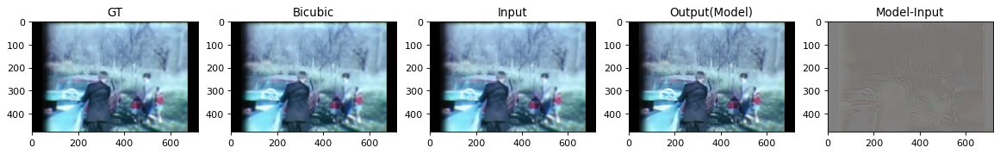

(7.375, 30.40101545749888, 20.592422501895523)

In [473]:
im_b = Image.open("/home/filip/Pictures/Screenshot from super8_best_from_mp2.mp4.png").convert("RGB")

display_PSNR(im_b, im_b, im_b, mcombine, channels=3)

im_input.shape= torch.Size([1, 3, 256, 256])
psnr for bicubic is 27.812864388746533dB
psnr for input is 28.501681302217943dB
psnr for Model is 28.782762593718946dB
PSNR improvement is 0.28108129150100325dB
Sharpness Measurement GroundTruth: 2236.2222292274237
Sharpness Measurement Bicubic: 20.592422501895523
Sharpness Measurement Input: 97.89891300513409
Sharpness Measurement Model: 171.56317663844675
Estimate of kernel: 3.388671875


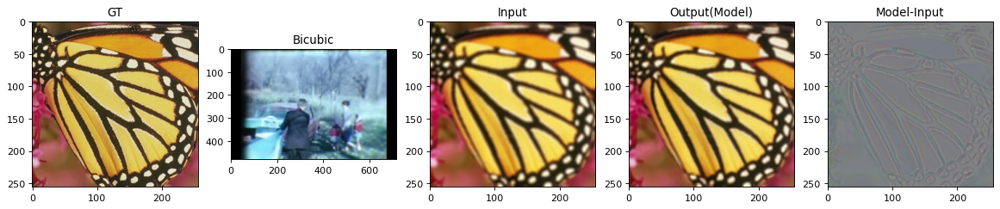

(3.388671875, 28.782762593718946, 97.89891300513409)

In [474]:
display_PSNR(im_gt, im_b, im_b2, mcombine, channels=3)


In [475]:
from jupyterplot import ProgressPlot


In [476]:
im_gt = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/baby_GT.bmp").convert("RGB")
im_b = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/baby_GT_scale_4.bmp").convert("RGB")
im_gt2 = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/head_GT.bmp").convert("RGB")
im_b2 = Image.open("/media/SSD/superres/pytorch-vdsr/Set5/head_GT_scale_4.bmp").convert("RGB")

In [478]:
pp = ProgressPlot(x_iterator=False,
                  x_label="k_act",
                  x_lim=[2, 16],
                  y_lim=[[0, 16],[28,35.0],[0,50]],
                  plot_names=["kernel",'PSNR','blurryness'],
                  line_names=["pred1","pred2"])
k_act = []
k_pred = []
for k in range(2,16):
    
    kp1, err1, sharpness1 = display_PSNR(im_gt, im_b, pil_disk_blur(im_gt,k), mcombine, channels=3, display = False)
    kp2, err2, sharpness2 = display_PSNR(im_gt2, im_b2, pil_disk_blur(im_gt2,k), mcombine, channels=3, display = False)
    #k_act.append(k)
    #k_pred.append(display_PSNR(im_gt, im_b, pil_disk_blur(im_gt,k), model, channels=1, display = False))
    pp.update(k,[[kp1,kp2],[err1,err2],[100/sharpness1,100/sharpness2]])
    print(k, kp1, err1,100/sharpness1)
pp.finalize()    

im_input.shape= torch.Size([1, 3, 512, 512])
im_input.shape= torch.Size([1, 3, 280, 280])
2 3.322265625 31.77413231834538 1.829382046125478
im_input.shape= torch.Size([1, 3, 512, 512])
im_input.shape= torch.Size([1, 3, 280, 280])
3 3.97265625 31.433225012300436 3.1138980534602365
im_input.shape= torch.Size([1, 3, 512, 512])
im_input.shape= torch.Size([1, 3, 280, 280])
4 4.69921875 31.197606999257115 4.684576228915555
im_input.shape= torch.Size([1, 3, 512, 512])
im_input.shape= torch.Size([1, 3, 280, 280])
5 5.609375 31.03109245049472 7.463293757269293
im_input.shape= torch.Size([1, 3, 512, 512])
im_input.shape= torch.Size([1, 3, 280, 280])
6 6.5234375 30.877512525881585 10.42101741127799
im_input.shape= torch.Size([1, 3, 512, 512])
im_input.shape= torch.Size([1, 3, 280, 280])
7 7.33984375 30.738852665111047 13.129422461086673
im_input.shape= torch.Size([1, 3, 512, 512])
im_input.shape= torch.Size([1, 3, 280, 280])
8 8.5 30.465085467437504 17.06806834427636
im_input.shape= torch.Size([1

In [479]:
from superres_utils import is_image_file
# Make this load still photos too, and have them added with frame = 0
def test_results(test_dir,scale, model, channels=1, display = False):
    instances = []
    psnr_bicubic_sum = 0
    psnr_model_sum = 0
    ct = 0
    
    for filename in listdir(test_dir):
        filepath = os.path.join(test_dir,filename)
        #print(filepath)
                
        if is_image_file(filepath):
            im_gt = Image.open(filepath).convert("RGB")
            #print(im_gt.size)
            
            (height, width) = im_gt.size
            im_b = im_gt.resize((int(2*height/scale), int(2*width/scale)), resample = Image.BICUBIC)
            im_b = im_b.resize((height,width), resample = Image.BICUBIC)
            im_b2 = pil_disk_blur(im_gt,scale)
            
            im_h, psnr_bicubic, psnr_predicted = display_PSNR(im_gt, im_b, im_b2, model, channels=channels, display = display)
            psnr_bicubic_sum = psnr_bicubic_sum + psnr_bicubic
            psnr_model_sum = psnr_model_sum + psnr_predicted
            ct = ct +1
            #item = {"Filepath":filepath, "Type":"image"}
            #instances.append(item)
        
    psnr_bicubic_avg = psnr_bicubic_sum / ct
    psnr_model_avg = psnr_model_sum / ct
        
    print("Bicubic average PSNR =",psnr_bicubic_avg)
    print("Model average PSNR =",psnr_model_avg)
    return 


im_input.shape= torch.Size([1, 3, 512, 512])
psnr for bicubic is 32.650890491818615dB
psnr for input is 32.17681713209845dB
psnr for Model is 30.058628319811636dB
PSNR improvement is -2.1181888122868138dB
Sharpness Measurement GroundTruth: 247.28295878820063
Sharpness Measurement Bicubic: 5.830031928082462
Sharpness Measurement Input: 3.8382870260975324
Sharpness Measurement Model: 24.58858646148292
Estimate of kernel: 10.703125


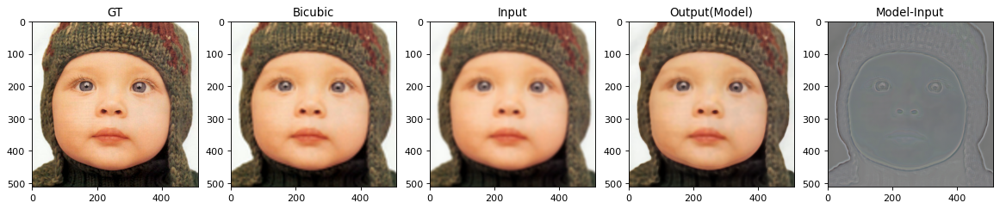

im_input.shape= torch.Size([1, 3, 344, 228])
psnr for bicubic is 31.549981423720233dB
psnr for input is 30.767495650176325dB
psnr for Model is 30.06145934356403dB
PSNR improvement is -0.7060363066122939dB
Sharpness Measurement GroundTruth: 726.1960912189749
Sharpness Measurement Bicubic: 12.662753095456495
Sharpness Measurement Input: 8.38781897880527
Sharpness Measurement Model: 25.686518823399826
Estimate of kernel: 5.6484375


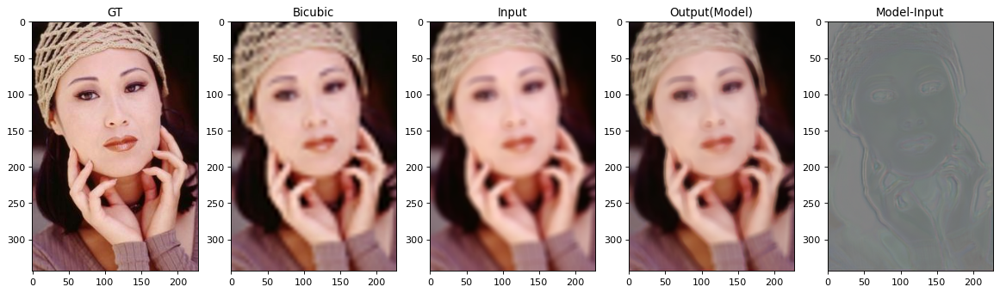

im_input.shape= torch.Size([1, 3, 256, 256])
psnr for bicubic is 29.737052218222605dB
psnr for input is 28.28187662428476dB
psnr for Model is 28.439637202209713dB
PSNR improvement is 0.1577605779249538dB
Sharpness Measurement GroundTruth: 2236.2222292274237
Sharpness Measurement Bicubic: 37.85383413149975
Sharpness Measurement Input: 29.25085386261344
Sharpness Measurement Model: 110.98396607278846
Estimate of kernel: 6.45703125


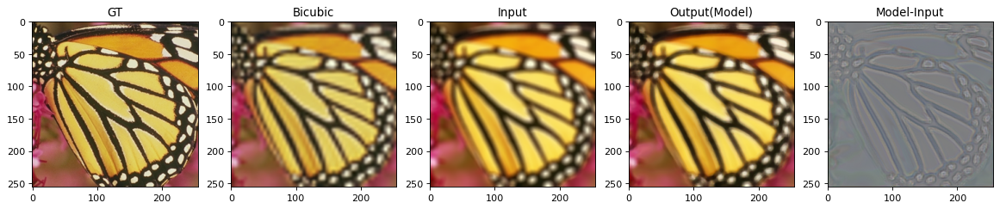

im_input.shape= torch.Size([1, 3, 280, 280])
psnr for bicubic is 31.451117691239556dB
psnr for input is 30.930463203135314dB
psnr for Model is 30.411269230232026dB
PSNR improvement is -0.5191939729032882dB
Sharpness Measurement GroundTruth: 593.2631865654935
Sharpness Measurement Bicubic: 3.717168220923573
Sharpness Measurement Input: 3.588571349828197
Sharpness Measurement Model: 12.149789972927948
Estimate of kernel: 6.09765625


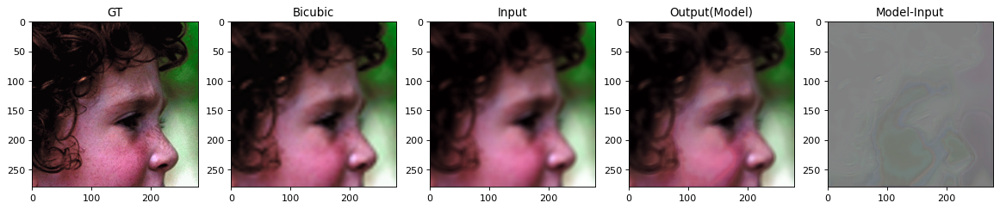

im_input.shape= torch.Size([1, 3, 288, 288])
psnr for bicubic is 31.65253729172023dB
psnr for input is 30.69663159011948dB
psnr for Model is 31.157958088420376dB
PSNR improvement is 0.46132649830089534dB
Sharpness Measurement GroundTruth: 233.21159694144288
Sharpness Measurement Bicubic: 9.125577950183256
Sharpness Measurement Input: 5.750526178212013
Sharpness Measurement Model: 27.92233021923217
Estimate of kernel: 9.1796875


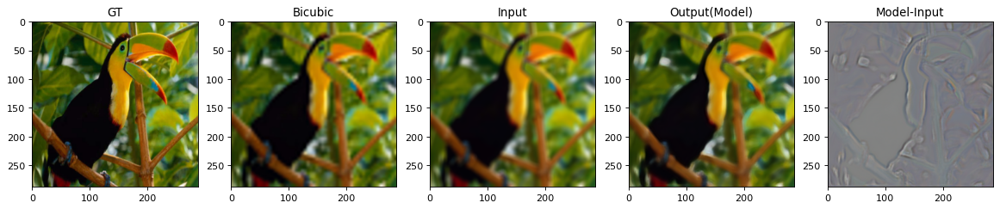

Bicubic average PSNR = 30.025790436847558
Model average PSNR = 10.163211479111292


In [484]:
test_results("/media/SSD/superres/video_data/test_data/Set5", 10, mcombine, channels = 3,display = True)

# convert sample videos

In [470]:
from superres_utils import decolorize_cv, colorize_cv, cv_center_crop

from torch.cuda.amp import autocast
def superres_mp4(infile, outfile, model,channels=1, factor=1.0,display=True,
                 bitrate= "12000k",errorfile = None, k_scale = 1, center_crop = None):
    
    mn=np.array([0.485, 0.456, 0.406])
    std=np.array([0.229, 0.224, 0.225])
    
    model = model.cuda()
    #torch.set_grad_enabled(False)
    model.eval()
    
    cap = cv2.VideoCapture(str(infile))
    length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps    = cap.get(cv2.CAP_PROP_FPS)
    
    if center_crop is None:
        width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        
    else:
        width,height = center_crop
    
    
    success_flag = False
    
    print("Original File:", str(infile))
    print("frames=",length,"\nwidth=",width,"\nheight=",height,"\nfps=",fps)
    
    

    new_height = int(height*factor)
    new_width = int(width*factor)
    
    print("\nProcess File:", str(outfile))
    print("factor:",factor,"\nwidth=",new_width, "\nheight=",new_height,"\nbitrate=",bitrate)
    
    

    dimension = '{}x{}'.format(new_width, new_height)  #ffmpeg uses bicubic as default scaling alg
    f_format = 'bgr24' # remember OpenCV uses bgr format




    command = ['ffmpeg',
            '-y',
            '-f', 'rawvideo',
            '-vcodec','rawvideo',
            '-s', dimension,
            '-pix_fmt', 'bgr24',
            '-r', str(fps),
            '-i', '-',
            '-i', str(infile),
            '-c:v', 'h264',
            '-c:a', 'aac',

            '-map','0:v:0',
            '-map','1:a:0',
            '-shortest',
            '-b:v', bitrate, 
            str(outfile) ]


    if errorfile is not None:
        ef = open(errorfile,"w+")
        p = sp.Popen(command, stdin=sp.PIPE, stderr=ef)
    else:
        p = sp.Popen(command, stdin=sp.PIPE)

    # Full processing with a stream instead of a temp file for video
    k_preds = []
    pbar = tqdm(total=length)
    while(cap.isOpened()):




        # Capture frame-by-frame
        ret, frame = cap.read()
        if ret == True:
            
            #crop frame if needed
            if center_crop is not None:
                frame = cv_center_crop(frame,(height,width))
            
            if (factor != 1.0):
                frame = cv2.resize(frame, (new_width, new_height), interpolation=cv2.INTER_LANCZOS4)
            
            if channels == 1:
                im_input, im_b_ycbcr = decolorize_cv(frame)

                im_input = Variable(torch.from_numpy(im_input).float()).view(1, -1, im_input.shape[0], im_input.shape[1])
                im_input = im_input.cuda()

                with torch.no_grad():
                    with autocast():
                        mout = model(im_input)
                out = (mout[0]*255.0).clamp(0,255)
                
                

                out = out.cpu()

                im_h_y = out.data[0].numpy().astype(np.float32)

                im_h_y = im_h_y[0,:,:]

                im_h = colorize_cv(im_h_y, im_b_ycbcr)
            elif channels == 3:
                im_input = cv2_to_batch_tensor(frame)
        
  
                im_input = im_input.cuda()
    
                
                
                with torch.no_grad():
                    with autocast():
                        mout = model(im_input)  
                
                if len(mout) >1:
                    out=mout[0].cpu()
                    
                else:
                    out = mout.cpu()
                    
                
                im_h = batch_tensor_to_cv2(out)
                

            #Add notation and crude bar chart to video frame
            
            if len(mout)>1:
                cv2.putText(im_h, text='k={:.2f}'.format(k_scale*mout[1].item()), org=(new_width-70,new_height-50),
                fontFace= cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(0,0,255),
                thickness=1, lineType=cv2.LINE_AA)
                
                cv2.putText(im_h, text='_', org=(new_width-5,new_height - int(new_height*mout[1].item()/17)),
                fontFace= cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=(0,0,255),
                thickness=2, lineType=cv2.LINE_AA)
                
                
            p.stdin.write(im_h.tobytes())


            if display:
                cv2.imshow('Processed',im_h)
                time.sleep(10)
                #cv2.imshow('Orig',frame)
            pbar.update(1)
            # Press Q on keyboard to  exit
            if cv2.waitKey(25) & 0xFF == ord('q'):
                success_flag = False
                break
        # Break the loop
        else:
            success_flag = True
            break
    # When everything done, release the video capture object

    pbar.close()

    p.stdin.close()
    p.wait()

    cap.release()

    # Closes all the frames
    cv2.destroyAllWindows()
    
    return success_flag

In [453]:
result_path

PosixPath('/media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1')

In [451]:


infile = "/media/SSD/superres/muffins30sec.mp4"
outfile = result_path/"muffins30sec-16.mp4"
superres_mp4(infile, outfile, mcombine,channels=3, factor=1.6,display=False,bitrate= "4000k")


  0%|          | 2/900 [00:00<01:04, 13.85it/s]

Original File: /media/SSD/superres/muffins30sec.mp4
frames= 900 
width= 320 
height= 240 
fps= 30.0

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1/muffins30sec-16.mp4
factor: 1.6 
width= 512 
height= 384 
bitrate= 4000k



 69%|██████▉   | 620/900 [00:51<00:23, 11.97it/s]


100%|██████████| 900/900 [01:14<00:00, 12.11it/s]


True

In [454]:
infile = "/media/SSD/superres/muffins30sec.mp4"
outfile = result_path/"muffins30sec-10.mp4"
superres_mp4(infile, outfile, mcombine,channels=3, factor=1.0,display=False,bitrate= "4000k")


  1%|          | 6/900 [00:00<00:16, 54.05it/s]

Original File: /media/SSD/superres/muffins30sec.mp4
frames= 900 
width= 320 
height= 240 
fps= 30.0

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1/muffins30sec-10.mp4
factor: 1.0 
width= 320 
height= 240 
bitrate= 4000k



100%|██████████| 900/900 [00:11<00:00, 75.62it/s]


True

In [455]:
infile = "/media/SSD/superres/muffins30sec.mp4"
outfile = result_path/"muffins30sec-20.mp4"
superres_mp4(infile, outfile, mcombine,channels=3, factor=2.0,display=False,bitrate= "4000k")


  0%|          | 0/900 [00:00<?, ?it/s]

Original File: /media/SSD/superres/muffins30sec.mp4
frames= 900 
width= 320 
height= 240 
fps= 30.0

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1/muffins30sec-20.mp4
factor: 2.0 
width= 640 
height= 480 
bitrate= 4000k



 69%|██████▊   | 617/900 [00:54<00:24, 11.33it/s]


100%|██████████| 900/900 [01:19<00:00, 11.29it/s]


True

In [456]:
infile = "/media/SSD/superres/muffins30sec.mp4"
outfile = result_path/"muffins30sec-30.mp4"
superres_mp4(infile, outfile, mcombine,channels=3, factor=3.0,display=False,bitrate= "4000k")



  0%|          | 0/900 [00:00<?, ?it/s]

Original File: /media/SSD/superres/muffins30sec.mp4
frames= 900 
width= 320 
height= 240 
fps= 30.0

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1/muffins30sec-30.mp4
factor: 3.0 
width= 960 
height= 720 
bitrate= 4000k



 36%|███▌      | 321/900 [00:37<01:01,  9.44it/s]


 75%|███████▌  | 679/900 [01:16<00:25,  8.82it/s]


100%|██████████| 900/900 [01:40<00:00,  8.92it/s]


True

In [459]:
dualfile= str(result_path/"muffins30sec-30dual.mp4")
infile = str(infile)
outfile = str(outfile)

In [460]:
# double scale for video x3 2 min
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -t 120 -filter_complex "[0:v] scale=iw*2:ih*2, pad=2*iw:ih [left]; [1:v] scale=iw/1.5:ih/1.5 [right]; [left][right] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su

In [461]:
# original scale , for video x3
#!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v] scale=iw*1:ih*1, pad=2*iw:ih [left]; [1:v] scale=iw/3:ih/3 [right]; [left][right] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

In [462]:
infile = "/media/SSD/superres/super8/super8_best_from_mp2.mp4"
outfile = result_path/"super8.mp4"
error_file = "/media/SSD/superres/error.txt"
superres_mp4(infile, outfile, mcombine,channels=3, factor=1.0,display=False,bitrate= "4000k",errorfile = error_file)

Original File: /media/SSD/superres/super8/super8_best_from_mp2.mp4
frames= 7195 
width= 720 
height= 480 
fps= 59.94005994005994

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1/super8.mp4
factor: 1.0 
width= 720 
height= 480 
bitrate= 4000k



  8%|▊         | 607/7195 [00:39<06:56, 15.80it/s]


 19%|█▉        | 1396/7195 [01:17<04:08, 23.31it/s]


 32%|███▏      | 2281/7195 [01:54<03:19, 24.67it/s]


 44%|████▍     | 3169/7195 [02:31<02:43, 24.57it/s]


 56%|█████▋    | 4059/7195 [03:07<02:02, 25.68it/s]


 69%|██████▉   | 4948/7195 [03:43<01:29, 25.25it/s]


 81%|████████  | 5842/7195 [04:17<00:49, 27.47it/s]


 94%|█████████▎| 6743/7195 [04:49<00:16, 28.14it/s]


100%|██████████| 7195/7195 [05:04<00:00, 23.59it/s]


True

In [463]:

dualfile = str(result_path/"super8dual.mp4")
infile = str(infile)
outfile = str(outfile)

In [464]:
# original scale , for film x1, removed un needed scaling
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v]  pad=2*iw:ih [left];  [left][1:v] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su

In [465]:
# compare this model to the last one
infile = "/media/SSD/superres/Results/Superresolution train New Network upscale PRelu L1 Div2 training/super8.mp4"
outfile = str(result_path/"super8.mp4")
dualfile= str(result_path/"super8-tolast-dual.mp4")

In [466]:
# original scale , for film x1, removed un needed scaling
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v]  pad=2*iw:ih [left];  [left][1:v] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su

In [467]:
infile = "/media/SSD/superres/super8/Old 8mm Reels_1.mp4"
outfile = str(result_path/"super8long.mp4")
error_file = "/media/SSD/superres/error.txt"
superres_mp4(infile, outfile, mcombine,channels=3, factor=1.0,display=False,bitrate= "4000k",errorfile = error_file)


  0%|          | 3/121409 [00:00<1:27:27, 23.14it/s]

Original File: /media/SSD/superres/super8/Old 8mm Reels_1.mp4
frames= 121409 
width= 720 
height= 480 
fps= 59.94005994005994

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1/super8long.mp4
factor: 1.0 
width= 720 
height= 480 
bitrate= 4000k



  1%|          | 865/121409 [00:30<1:12:07, 27.86it/s]


  1%|▏         | 1701/121409 [01:00<1:09:35, 28.67it/s]


  2%|▏         | 2537/121409 [01:30<1:11:48, 27.59it/s]


  3%|▎         | 3371/121409 [01:59<1:13:33, 26.75it/s]


  3%|▎         | 4200/121409 [02:28<1:08:54, 28.35it/s]


  4%|▍         | 5043/121409 [02:58<1:07:41, 28.65it/s]


  5%|▍         | 5955/121409 [03:29<1:02:08, 30.96it/s]


  6%|▌         | 6904/121409 [04:01<1:05:35, 29.10it/s]


  6%|▋         | 7847/121409 [04:33<1:05:47, 28.77it/s]


  7%|▋         | 8787/121409 [05:05<1:03:46, 29.44it/s]


  8%|▊         | 9711/121409 [05:36<1:04:07, 29.03it/s]


  9%|▉         | 10649/121409 [06:08<1:00:58, 30.27it/s]


 10%|▉         | 11563/121409 [06:39<1:00:27, 30.28it/s]


 10%|█         | 12483/121409 [07:10<1:02:41, 28.96it/s]


 11%|█         | 13479/121409 [07:43<58:33, 30.72it/s]


 12%|█▏        | 14540/121409 [08:19<58:31, 30.44it/s]


 13%|█▎        | 15563/121409 [08:53<58:41, 30.05it/s]


 14%|█▎        | 16585/121409 [09:27<56:52, 30.72it/s]


 15%|█▍        | 17632/121409 [10:01<58:29, 29.57it/s]


 15%|█▌        | 18706/121409 [10:37<56:15, 30.43it/s]


 16%|█▋        | 19776/121409 [11:13<56:25, 30.02it/s]


 17%|█▋        | 20841/121409 [11:48<57:28, 29.16it/s]


 18%|█▊        | 21906/121409 [12:23<53:25, 31.04it/s]


 19%|█▉        | 22931/121409 [12:57<54:11, 30.29it/s]


 20%|█▉        | 23999/121409 [13:33<52:30, 30.92it/s]


 21%|██        | 25055/121409 [14:08<53:09, 30.21it/s]


 21%|██▏       | 26078/121409 [14:42<53:25, 29.74it/s]


 22%|██▏       | 27150/121409 [15:17<52:48, 29.75it/s]


 23%|██▎       | 28199/121409 [15:52<52:09, 29.78it/s]


 24%|██▍       | 29260/121409 [16:27<51:33, 29.79it/s]


 25%|██▍       | 30335/121409 [17:03<50:38, 29.98it/s]


 26%|██▌       | 31391/121409 [17:38<49:49, 30.12it/s]


 27%|██▋       | 32441/121409 [18:13<50:14, 29.52it/s]


 28%|██▊       | 33466/121409 [18:47<47:12, 31.05it/s]


 28%|██▊       | 34575/121409 [19:23<48:05, 30.10it/s]


 29%|██▉       | 35666/121409 [19:59<47:11, 30.28it/s]


 30%|███       | 36775/121409 [20:36<46:13, 30.52it/s]


 31%|███       | 37895/121409 [21:13<46:33, 29.90it/s]


 32%|███▏      | 38959/121409 [21:48<48:00, 28.62it/s]


 33%|███▎      | 40051/121409 [22:24<45:42, 29.66it/s]


 34%|███▍      | 41160/121409 [23:00<44:13, 30.24it/s]


 35%|███▍      | 42245/121409 [23:36<42:26, 31.09it/s]


 36%|███▌      | 43358/121409 [24:13<43:19, 30.02it/s]


 37%|███▋      | 44446/121409 [24:48<42:17, 30.33it/s]


 37%|███▋      | 45505/121409 [25:23<42:31, 29.75it/s]


 38%|███▊      | 46578/121409 [25:59<40:42, 30.64it/s]


 39%|███▉      | 47698/121409 [26:36<40:00, 30.70it/s]


 40%|████      | 48823/121409 [27:12<39:34, 30.57it/s]


 41%|████      | 49908/121409 [27:48<39:35, 30.10it/s]


 42%|████▏     | 50984/121409 [28:24<38:45, 30.28it/s]


 43%|████▎     | 52091/121409 [29:00<39:05, 29.55it/s]


 44%|████▍     | 53179/121409 [29:36<36:39, 31.02it/s]


 45%|████▍     | 54282/121409 [30:13<37:30, 29.83it/s]


 46%|████▌     | 55387/121409 [30:49<36:02, 30.54it/s]


 47%|████▋     | 56465/121409 [31:25<36:18, 29.82it/s]


 47%|████▋     | 57568/121409 [32:01<35:16, 30.17it/s]


 48%|████▊     | 58661/121409 [32:37<34:16, 30.52it/s]


 49%|████▉     | 59756/121409 [33:13<34:07, 30.11it/s]


 50%|█████     | 60848/121409 [33:49<33:40, 29.97it/s]


 51%|█████     | 61922/121409 [34:25<32:13, 30.77it/s]


 52%|█████▏    | 63021/121409 [35:01<32:04, 30.35it/s]


 53%|█████▎    | 64102/121409 [35:37<32:40, 29.23it/s]


 54%|█████▎    | 65180/121409 [36:12<31:22, 29.88it/s]


 55%|█████▍    | 66275/121409 [36:48<31:22, 29.29it/s]


 55%|█████▌    | 67359/121409 [37:24<29:05, 30.96it/s]


 56%|█████▋    | 68461/121409 [38:00<28:58, 30.45it/s]


 57%|█████▋    | 69570/121409 [38:37<28:30, 30.30it/s]


 58%|█████▊    | 70650/121409 [39:13<28:20, 29.85it/s]


 59%|█████▉    | 71751/121409 [39:48<28:23, 29.15it/s]


 60%|█████▉    | 72813/121409 [40:24<27:03, 29.94it/s]


 61%|██████    | 73919/121409 [41:00<26:10, 30.24it/s]


 62%|██████▏   | 75019/121409 [41:36<25:13, 30.65it/s]


 63%|██████▎   | 76128/121409 [42:13<24:48, 30.42it/s]


 64%|██████▎   | 77216/121409 [42:49<24:44, 29.76it/s]


 65%|██████▍   | 78309/121409 [43:25<24:05, 29.82it/s]


 65%|██████▌   | 79414/121409 [44:01<23:29, 29.79it/s]


 66%|██████▋   | 80493/121409 [44:37<22:43, 30.00it/s]


 67%|██████▋   | 81591/121409 [45:13<21:58, 30.19it/s]


 68%|██████▊   | 82688/121409 [45:49<21:14, 30.38it/s]


 69%|██████▉   | 83793/121409 [46:26<20:16, 30.92it/s]


 70%|██████▉   | 84898/121409 [47:02<20:10, 30.17it/s]


 71%|███████   | 85945/121409 [47:37<19:47, 29.87it/s]


 72%|███████▏  | 87014/121409 [48:12<19:18, 29.69it/s]


 73%|███████▎  | 88108/121409 [48:48<18:25, 30.12it/s]


 73%|███████▎  | 89178/121409 [49:24<17:50, 30.10it/s]


 74%|███████▍  | 90272/121409 [50:00<16:56, 30.62it/s]


 75%|███████▌  | 91368/121409 [50:36<16:07, 31.05it/s]


 76%|███████▌  | 92475/121409 [51:12<15:49, 30.48it/s]


 77%|███████▋  | 93573/121409 [51:49<15:41, 29.58it/s]


 78%|███████▊  | 94676/121409 [52:25<14:44, 30.21it/s]


 79%|███████▉  | 95766/121409 [53:01<13:40, 31.26it/s]


 80%|███████▉  | 96860/121409 [53:37<13:48, 29.62it/s]


 81%|████████  | 97960/121409 [54:13<12:49, 30.47it/s]


 82%|████████▏ | 99065/121409 [54:49<12:25, 29.96it/s]


 82%|████████▏ | 100154/121409 [55:25<11:48, 30.00it/s]


 83%|████████▎ | 101244/121409 [56:01<11:16, 29.79it/s]


 84%|████████▍ | 102340/121409 [56:37<10:29, 30.29it/s]


 85%|████████▌ | 103397/121409 [57:12<09:58, 30.09it/s]


 86%|████████▌ | 104477/121409 [57:47<09:07, 30.93it/s]


 87%|████████▋ | 105545/121409 [58:23<08:33, 30.89it/s]


 88%|████████▊ | 106587/121409 [58:57<08:11, 30.18it/s]


 89%|████████▊ | 107647/121409 [59:32<07:38, 29.99it/s]


 90%|████████▉ | 108737/121409 [1:00:08<06:48, 31.05it/s]


 90%|█████████ | 109794/121409 [1:00:43<06:11, 31.23it/s]


 91%|█████████▏| 110813/121409 [1:01:16<05:50, 30.22it/s]


 92%|█████████▏| 111846/121409 [1:01:50<05:10, 30.79it/s]


 93%|█████████▎| 112893/121409 [1:02:25<04:38, 30.54it/s]


 94%|█████████▍| 113940/121409 [1:02:59<04:04, 30.57it/s]


 95%|█████████▍| 114991/121409 [1:03:34<03:24, 31.37it/s]


 96%|█████████▌| 116033/121409 [1:04:08<02:57, 30.23it/s]


 96%|█████████▋| 117078/121409 [1:04:42<02:25, 29.86it/s]


 97%|█████████▋| 118133/121409 [1:05:17<01:49, 29.89it/s]


 98%|█████████▊| 119173/121409 [1:05:51<01:16, 29.18it/s]


 99%|█████████▉| 120176/121409 [1:06:25<00:41, 29.75it/s]


100%|█████████▉| 121200/121409 [1:06:58<00:06, 30.24it/s]


100%|██████████| 121409/121409 [1:07:05<00:00, 30.16it/s]


True

In [468]:
dualfile= str(result_path/"super8longdual.mp4")
infile = str(infile)
outfile = str(outfile)

In [469]:
# original scale , for film x1, removed un needed scaling
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v]  pad=2*iw:ih [left];  [left][1:v] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su

In [481]:
infile = "/media/SSD/superres/super8/Old 8mm Reels_1.mp4"
outfile = str(result_path/"super8longcrop.mp4")
error_file = "/media/SSD/superres/error.txt"
superres_mp4(infile, outfile, mcombine,channels=3, factor=1.0,display=False,bitrate= "4000k",
             errorfile = error_file, center_crop = (680,450))

  0%|          | 2/121409 [00:00<2:23:04, 14.14it/s]

Original File: /media/SSD/superres/super8/Old 8mm Reels_1.mp4
frames= 121409 
width= 680 
height= 450 
fps= 59.94005994005994

Process File: /media/SSD/superres/Results/Superresolution train New Network with kernel predictor input v1/super8longcrop.mp4
factor: 1.0 
width= 680 
height= 450 
bitrate= 4000k


100%|██████████| 121409/121409 [1:04:48<00:00, 31.22it/s]


True

In [482]:
dualfile= str(result_path/"super8longcropdual.mp4")
infile = str(infile)
outfile = str(outfile)

In [483]:
# original scale , for film x1, removed un needed scaling
!ffmpeg -i {'"'+infile+'"'} -i {'"'+outfile+'"'} -filter_complex "[0:v]  pad=2*iw:ih [left];  [left][1:v] overlay=main_w/2:0" -b:v 4000k {'"'+dualfile+'"'}

ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.5.0 (crosstool-NG 1.24.0.131_87df0e6_dirty)
  configuration: --prefix=/media/SSD/conda_env/superres --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1596712246804/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  7.100 /  5.  7.100
  libswresample   3.  7.100 /  3.  7.100
  libpostproc    55.  7.100 / 55.  7.100
Input #0, mov,mp4,m4a,3gp,3g2,mj2, from '/media/SSD/su